In [1]:
# Building upon housing, parks, and income data

In [2]:
# By: Adriana Valencia Wences

In [3]:
# first I will import my libraries
# pandas for data analysis
import pandas as pd
# geopandas for spatial analysis
import geopandas as gpd
# contextily for basemaps
import contextily as ctx
# networkx for network analysis
import networkx as nx
# for street network analysis
import osmnx as ox
import matplotlib.pyplot as plt

In [4]:
#import the LAC Affordable Housing data
LAC_aff_housing_clean = gpd.read_file('data/lac_clean_FINAL.csv')

In [5]:
#look at data
LAC_aff_housing_clean.head()

,PropertyName,PropertyAddress,City,State,Zip,County,CountyCode,CensusTract,CongressionalDistrict,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,geometry
0,GOOD SHEPHERD HOMES,510 Centinela Ave,Inglewood,CA,90302-3246,Los Angeles,6037,6037600902,43,33.97285,-118.34935,Disabled,202/8 NC,4% Tax Credit,None
1,GRACE MANOR,508 Grace Ave,Inglewood,CA,90301-1338,Los Angeles,6037,6037601001,43,33.968018,-118.348181,Disabled,PRAC/811,,None
2,HOMEWARD BOUND 2000,419 E Tamarack Ave,Inglewood,CA,90301-6309,Los Angeles,6037,6037601002,43,33.95925,-118.34798,Disabled,PRAC/811,,None
3,HOMEWARD BOUND-INGLEWOOD,550 W Regent St,Inglewood,CA,90301-1080,Los Angeles,6037,6037601401,43,33.96387,-118.36551,Disabled,PRAC/811,,None
4,PACIFIC RIM APARTMENTS,230 S Grevillea Ave,Inglewood,CA,90301-2349,Los Angeles,6037,6037601211,43,33.96085,-118.3543,Disabled,202/8 NC,,None


In [6]:
# managed to clean up the data from the chart before, now I will plot the data by city and site numbers
# first, make a list of categories in dataset
list(LAC_aff_housing_clean)

['PropertyName',
 'PropertyAddress',
 'City',
 'State',
 'Zip',
 'County',
 'CountyCode',
 'CensusTract',
 'CongressionalDistrict',
 'Latitude',
 'Longitude',
 'TargetTenantType',
 'S8_1_ProgramName',
 'LIHTC_1_ProgramName',
 'geometry']

In [7]:
# how many affordable housing projects per city?
LAC_aff_housing_clean['City'].value_counts()

Los Angeles    867
Long Beach      48
Pasadena        34
Palmdale        22
Inglewood       16
Name: City, dtype: int64

In [8]:
# I managed to group all neighborhoods of LA City into "Los Angeles," which is why the number of sites grew. Now I will save this data as a value.
site_count = LAC_aff_housing_clean['City'].value_counts()

In [9]:
# now save it as a dataframe
site_count = site_count.reset_index()

In [10]:
# rename as a list
site_count.columns.to_list()

['index', 'City']

In [11]:
# rename the columns
site_count.columns = ['City', 'Number of Sites']

In [12]:
# look at what we made
site_count

,City,Number of Sites
0,Los Angeles,867
1,Long Beach,48
2,Pasadena,34
3,Palmdale,22
4,Inglewood,16


<AxesSubplot:>

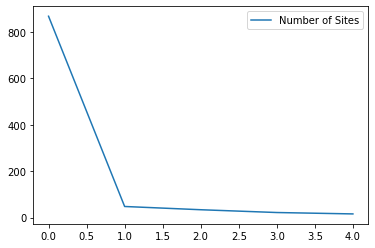

In [13]:
# plot it
site_count.plot()

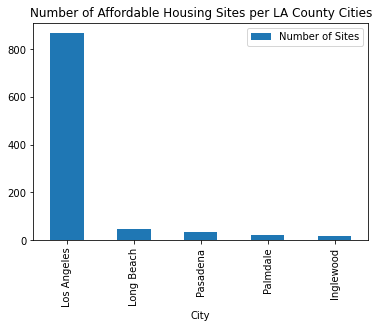

In [14]:
# provide arguments to plot
site_count.plot.bar(x = 'City', y = 'Number of Sites', title = 'Number of Affordable Housing Sites per LA County Cities')
figsize = (20,20)

In [15]:
# Trimming the data: output the original data's info
LAC_aff_housing_clean.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 987 entries, 0 to 986
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   PropertyName           987 non-null    object  
 1   PropertyAddress        987 non-null    object  
 2   City                   987 non-null    object  
 3   State                  987 non-null    object  
 4   Zip                    987 non-null    object  
 5   County                 987 non-null    object  
 6   CountyCode             987 non-null    object  
 7   CensusTract            987 non-null    object  
 8   CongressionalDistrict  987 non-null    object  
 9   Latitude               987 non-null    object  
 10  Longitude              987 non-null    object  
 11  TargetTenantType       987 non-null    object  
 12  S8_1_ProgramName       987 non-null    object  
 13  LIHTC_1_ProgramName    987 non-null    object  
 14  geometry               0 non-null 

In [16]:
# show a dataframe with a subset of columns
LAC_aff_housing_clean[['PropertyName','City','Zip','Latitude','Longitude','TargetTenantType','S8_1_ProgramName','LIHTC_1_ProgramName']]

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName
0,GOOD SHEPHERD HOMES,Inglewood,90302-3246,33.97285,-118.34935,Disabled,202/8 NC,4% Tax Credit
1,GRACE MANOR,Inglewood,90301-1338,33.968018,-118.348181,Disabled,PRAC/811,
2,HOMEWARD BOUND 2000,Inglewood,90301-6309,33.95925,-118.34798,Disabled,PRAC/811,
3,HOMEWARD BOUND-INGLEWOOD,Inglewood,90301-1080,33.96387,-118.36551,Disabled,PRAC/811,
4,PACIFIC RIM APARTMENTS,Inglewood,90301-2349,33.96085,-118.3543,Disabled,202/8 NC,
...,...,...,...,...,...,...,...,...
982,WASHINGTON VILLA APARTMENTS,Pasadena,91104-2195,34.16879,-118.14527,Family,,9% Tax Credit
983,EUCLID VILLA TRANSITION HOUSING,Pasadena,91101-4666,34.14278,-118.1428,Family,,9% Tax Credit
984,ORANGE GROVE GARDENS,Pasadena,91104-5306,34.15775,-118.1449,Family,,9% Tax Credit
985,KINGS VILLAGES,Pasadena,91103-2513,34.165907,-118.152628,Family,PD/8 Existing,4% Tax Credit


In [17]:
# list of desired column names
desired_columns = ['PropertyName','City','Zip','Latitude','Longitude','TargetTenantType','S8_1_ProgramName','LIHTC_1_ProgramName']

# subset based on desired columns
LAC_aff_housing_clean[desired_columns].sample(5)

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName
912,NEW VENICE 3C,Los Angeles,90291-3875,33.99636,-118.46171,,LMSA,
870,ASTORIA PLACE TOWNHOMES,Los Angeles,91342-4320,34.31097,-118.43791,Family,,9% Tax Credit
219,MARTEL PARK,Los Angeles,90046,34.08782,-118.3512,Elderly,Sec 8 NC,
663,LDK SENIOR APARTMENTS,Los Angeles,90019-1978,34.056101,-118.321793,Elderly or disabled,,4% Tax Credit
305,BROADCAST CENTER,Los Angeles,90036-2734,34.07603,-118.35654,,,4% Tax Credit


In [18]:
aff_housing_trimmed = LAC_aff_housing_clean[desired_columns].copy()
aff_housing_trimmed

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName
0,GOOD SHEPHERD HOMES,Inglewood,90302-3246,33.97285,-118.34935,Disabled,202/8 NC,4% Tax Credit
1,GRACE MANOR,Inglewood,90301-1338,33.968018,-118.348181,Disabled,PRAC/811,
2,HOMEWARD BOUND 2000,Inglewood,90301-6309,33.95925,-118.34798,Disabled,PRAC/811,
3,HOMEWARD BOUND-INGLEWOOD,Inglewood,90301-1080,33.96387,-118.36551,Disabled,PRAC/811,
4,PACIFIC RIM APARTMENTS,Inglewood,90301-2349,33.96085,-118.3543,Disabled,202/8 NC,
...,...,...,...,...,...,...,...,...
982,WASHINGTON VILLA APARTMENTS,Pasadena,91104-2195,34.16879,-118.14527,Family,,9% Tax Credit
983,EUCLID VILLA TRANSITION HOUSING,Pasadena,91101-4666,34.14278,-118.1428,Family,,9% Tax Credit
984,ORANGE GROVE GARDENS,Pasadena,91104-5306,34.15775,-118.1449,Family,,9% Tax Credit
985,KINGS VILLAGES,Pasadena,91103-2513,34.165907,-118.152628,Family,PD/8 Existing,4% Tax Credit


In [19]:
type(aff_housing_trimmed)

pandas.core.frame.DataFrame

In [20]:
aff_housing_trimmed.dtypes

PropertyName           object
City                   object
Zip                    object
Latitude               object
Longitude              object
TargetTenantType       object
S8_1_ProgramName       object
LIHTC_1_ProgramName    object
dtype: object

In [21]:
# lat long data will not read unless it is a float, so I will convert them
aff_housing_trimmed['Latitude'] = aff_housing_trimmed['Latitude'].astype(float)

In [22]:
aff_housing_trimmed.dtypes

PropertyName            object
City                    object
Zip                     object
Latitude               float64
Longitude               object
TargetTenantType        object
S8_1_ProgramName        object
LIHTC_1_ProgramName     object
dtype: object

In [23]:
aff_housing_trimmed['Longitude'] = aff_housing_trimmed['Longitude'].astype(float)

In [24]:
aff_housing_trimmed.dtypes

PropertyName            object
City                    object
Zip                     object
Latitude               float64
Longitude              float64
TargetTenantType        object
S8_1_ProgramName        object
LIHTC_1_ProgramName     object
dtype: object

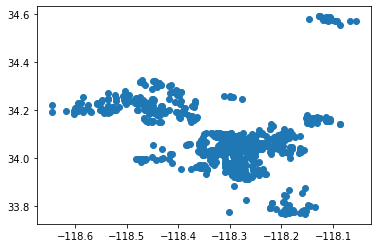

In [25]:
plt.scatter(x=aff_housing_trimmed['Longitude'], y=aff_housing_trimmed['Latitude'])
plt.show()


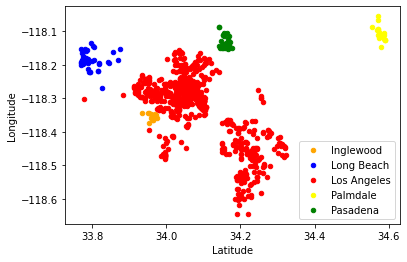

In [26]:
fig, ax = plt.subplots()

colors = {'Los Angeles':'red', 'Long Beach':'blue', 'Pasadena':'green', 'Palmdale':'yellow', 'Inglewood':'orange'}

grouped = aff_housing_trimmed.groupby('City')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='Latitude', y='Longitude', label=key, color=colors[key])

plt.show()

In [27]:
# each color represents a city! now to map with folium
import folium

In [28]:
# default folium map
m = folium.Map()
m

In [29]:
# average latitude
latitude = aff_housing_trimmed.Latitude.mean()
latitude

34.077650696048615

In [30]:
# average longitude
longitude = aff_housing_trimmed.Longitude.mean()
longitude

-118.3079924447822

In [31]:
#centering based on average latitude / longitude means
m = folium.Map(location=[34.077650696048615,-118.3079924447822])
m

In [32]:
# loop through a dataframe:
for index, row in aff_housing_trimmed.iterrows():
    print(row.PropertyName, row.Latitude, row.Longitude)

GOOD SHEPHERD HOMES 33.97285 -118.34935
GRACE MANOR 33.968018 -118.348181
HOMEWARD BOUND 2000 33.95925 -118.34798
HOMEWARD BOUND-INGLEWOOD 33.96387 -118.36551
PACIFIC RIM APARTMENTS 33.96085 -118.3543
REGENT PLAZA 33.96449 -118.35738
REGENCY TOWERS 33.96396 -118.35082
OSAGE SENIOR VILLAS 33.95163 -118.34513
PATH VILLAS OSAGE APARTMENTS 33.953472 -118.34496
REGENT SQUARE 33.964873 -118.365319
WESTSIDE II 33.953836 -118.374435
EUCALYPTUS PARK 33.97357 -118.36016
INGLEWOOD MEADOWS 33.96298 -118.35027
MARKET PARK APARTMENTS 33.97124 -118.35549
PATH VILLAS EUCALYPTUS 33.957601 -118.358778
OSAGE APARTMENTS 33.9337 -118.34546
MERIT HALL APARTMENTS 33.7798 -118.17985
DEL AMO GARDENS 33.826 -118.2694
AMERICAN GOLD STAR MANOR 33.814303 -118.217892
PARK PACIFIC TOWER 33.775673 -118.193323
SEAMIST TOWER 33.784667 -118.185159
LONG BEACH MANOR 33.796523 -118.134524
BELMENO MANOR 33.801826 -118.144632
SCHERER PARK APARTMENTS 33.842607 -118.191831
BEACHWOOD APARTMENTS 33.77443 -118.19842
PACIFIC COAST

In [33]:
# add the zipcodes
for index, row in aff_housing_trimmed.iterrows():
    # add folium marker code
    folium.Marker([row.Latitude, row.Longitude], popup=row.PropertyName, tooltip=row.PropertyName).add_to(m)
m

In [34]:
# add a new column
aff_housing_trimmed['blue'] = 'Long Beach'
aff_housing_trimmed['green'] = 'Pasadena'
aff_housing_trimmed['purple'] = 'Inglewood'
aff_housing_trimmed['orange'] = 'Palmdale'
aff_housing_trimmed['gray'] = 'Los Angeles'

In [35]:
aff_housing_trimmed.head()

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray
0,GOOD SHEPHERD HOMES,Inglewood,90302-3246,33.972850,-118.349350,Disabled,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
1,GRACE MANOR,Inglewood,90301-1338,33.968018,-118.348181,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
2,HOMEWARD BOUND 2000,Inglewood,90301-6309,33.959250,-118.347980,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
3,HOMEWARD BOUND-INGLEWOOD,Inglewood,90301-1080,33.963870,-118.365510,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
4,PACIFIC RIM APARTMENTS,Inglewood,90301-2349,33.960850,-118.354300,Disabled,202/8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles


In [36]:
# find unique values in the City column
aff_housing_trimmed.City.unique()

array(['Inglewood', 'Long Beach', 'Los Angeles', 'Palmdale', 'Pasadena'],
      dtype=object)

In [37]:
# display rows that match a query
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Long Beach']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray
16,MERIT HALL APARTMENTS,Long Beach,90813-3682,33.779800,-118.179850,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
17,DEL AMO GARDENS,Long Beach,90745,33.826000,-118.269400,Elderly,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
18,AMERICAN GOLD STAR MANOR,Long Beach,90810-2708,33.814303,-118.217892,Elderly or disabled,,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
19,PARK PACIFIC TOWER,Long Beach,90813-4234,33.775673,-118.193323,Elderly,LMSA,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
20,SEAMIST TOWER,Long Beach,90813-2076,33.784667,-118.185159,Elderly,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
21,LONG BEACH MANOR,Long Beach,90815-2522,33.796523,-118.134524,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
22,BELMENO MANOR,Long Beach,90815-1704,33.801826,-118.144632,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
23,SCHERER PARK APARTMENTS,Long Beach,90805-6961,33.842607,-118.191831,Elderly,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
24,BEACHWOOD APARTMENTS,Long Beach,90802-1109,33.774430,-118.198420,Disabled,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles
25,PACIFIC COAST VILLA,Long Beach,90806-5520,33.789760,-118.183640,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles


In [38]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Long Beach', 'color'] = 'lightblue'

In [39]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Long Beach']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray,color
16,MERIT HALL APARTMENTS,Long Beach,90813-3682,33.779800,-118.179850,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
17,DEL AMO GARDENS,Long Beach,90745,33.826000,-118.269400,Elderly,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
18,AMERICAN GOLD STAR MANOR,Long Beach,90810-2708,33.814303,-118.217892,Elderly or disabled,,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
19,PARK PACIFIC TOWER,Long Beach,90813-4234,33.775673,-118.193323,Elderly,LMSA,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
20,SEAMIST TOWER,Long Beach,90813-2076,33.784667,-118.185159,Elderly,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
21,LONG BEACH MANOR,Long Beach,90815-2522,33.796523,-118.134524,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
22,BELMENO MANOR,Long Beach,90815-1704,33.801826,-118.144632,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
23,SCHERER PARK APARTMENTS,Long Beach,90805-6961,33.842607,-118.191831,Elderly,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
24,BEACHWOOD APARTMENTS,Long Beach,90802-1109,33.774430,-118.198420,Disabled,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue
25,PACIFIC COAST VILLA,Long Beach,90806-5520,33.789760,-118.183640,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightblue


In [40]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Los Angeles']
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Los Angeles', 'color'] = 'lightgray'
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Los Angeles']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray,color
64,PARTHENIA TOWNHOUSES,Los Angeles,91304-1650,34.228100,-118.594410,Family,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
65,CANOGA PARK,Los Angeles,91306-3900,34.194573,-118.570394,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
66,MILWOOD APARTMENTS,Los Angeles,91303-2142,34.195990,-118.594160,Elderly,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
67,ROSCOE PARK APARTMENTS,Los Angeles,91304-4385,34.220450,-118.592450,Family,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
68,DE SOTO GARDENS,Los Angeles,91304-1908,34.229850,-118.588430,Family,Preservation,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,ROSCOE APARTMENTS,Los Angeles,91306-1679,34.220050,-118.574250,Family,,9% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
927,RUNNYMEDE SPRINGS,Los Angeles,91306-3058,34.207020,-118.577160,Family,,9% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
928,WINNETKA SENIOR APARTMENTS,Los Angeles,91306-3782,34.200501,-118.585575,Elderly or disabled,,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray
929,RANCHO DEL VALLE,Los Angeles,91367-2700,34.189977,-118.569889,Disabled,202/8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,lightgray


In [41]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Pasadena']
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Pasadena', 'color'] = 'green'
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Pasadena']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray,color
953,HFL ASHTABULA HOMES,Pasadena,91104-4202,34.159300,-118.142477,Family,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
954,CASA D'ORO II,Pasadena,91104-2946,34.165920,-118.124530,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
955,PASADENA ACCESSIBLE APARTMENTS,Pasadena,91104-2419,34.170590,-118.131810,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
956,WYNN HOUSE,Pasadena,91107-2333,34.154280,-118.111030,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
957,CASA D'ORO I,Pasadena,91104-2708,34.169980,-118.114130,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
958,VILLA YUCATAN,Pasadena,91107-2415,34.154290,-118.105470,Family,LMSA,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
959,GREEN HOTEL,Pasadena,91105-2043,34.144420,-118.149660,Elderly,LMSA,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
960,THE GROVES,Pasadena,91104-4569,34.161460,-118.136240,Family,LMSA,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
961,MAGNOLIA TOWNHOMES,Pasadena,91103-2665,34.165910,-118.148980,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green
962,HUDSON GARDENS,Pasadena,91104-2868,34.167250,-118.134080,Elderly,HFDA/8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,green


In [42]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Inglewood']
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Inglewood', 'color'] = 'purple'
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Inglewood']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray,color
0,GOOD SHEPHERD HOMES,Inglewood,90302-3246,33.972850,-118.349350,Disabled,202/8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
1,GRACE MANOR,Inglewood,90301-1338,33.968018,-118.348181,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
2,HOMEWARD BOUND 2000,Inglewood,90301-6309,33.959250,-118.347980,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
3,HOMEWARD BOUND-INGLEWOOD,Inglewood,90301-1080,33.963870,-118.365510,Disabled,PRAC/811,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
4,PACIFIC RIM APARTMENTS,Inglewood,90301-2349,33.960850,-118.354300,Disabled,202/8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
5,REGENT PLAZA,Inglewood,90301-1249,33.964490,-118.357380,Elderly,Sec 8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
6,REGENCY TOWERS,Inglewood,90301-1864,33.963960,-118.350820,Elderly,Sec 8 NC,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
7,OSAGE SENIOR VILLAS,Inglewood,90301-4100,33.951630,-118.345130,Elderly or disabled,,9% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
8,PATH VILLAS OSAGE APARTMENTS,Inglewood,90301-3550,33.953472,-118.344960,Family,,9% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple
9,REGENT SQUARE,Inglewood,90301-1198,33.964873,-118.365319,,,4% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,purple


In [43]:
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Palmdale']
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Palmdale', 'color'] = 'orange'
aff_housing_trimmed.loc[aff_housing_trimmed['City'] == 'Palmdale']

,PropertyName,City,Zip,Latitude,Longitude,TargetTenantType,S8_1_ProgramName,LIHTC_1_ProgramName,blue,green,purple,orange,gray,color
931,PALMDALE DESERT CLUB APARTMENTS,Palmdale,93550-5454,34.571094,-118.093830,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
932,DESERT VIEW APARTMENTS,Palmdale,93550-3885,34.585228,-118.112964,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
933,PALMDALE APARTMENTS,Palmdale,93550-5171,34.573400,-118.102230,Family,LMSA,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
934,VILLAGE GARDENS,Palmdale,93550-1951,34.571903,-118.110566,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
935,PALMDALE GARDENS APARTMENTS,Palmdale,93550-3806,34.584400,-118.112940,Elderly,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
936,STANRIDGE HOMES #3,Palmdale,93550-3243,34.590071,-118.126121,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
937,STANRIDGE HOMES #2,Palmdale,93550-3242,34.589730,-118.126760,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
938,STANRIDGE HOMES #1,Palmdale,93550-3242,34.589730,-118.126760,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
939,EAST 35TH STREET APARTMENTS,Palmdale,93550-5659,34.571960,-118.067680,Family,Sec 8 NC,,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange
940,LONGHORN PAVILION,Palmdale,93550-4497,34.554620,-118.087290,Family,,9% Tax Credit,Long Beach,Pasadena,Inglewood,Palmdale,Los Angeles,orange


In [44]:
# reset the map (you need to do this to erase previous layers)
m = folium.Map(location=[latitude,longitude], tiles='Stamen Terrain', zoom_start=10)

In [45]:
# add the stations with color icons
for index, row in aff_housing_trimmed.iterrows():
    tooltip_text = row.City + ' City: ' + row.PropertyName
    folium.Marker(
        [row.Latitude,row.Longitude], 
        popup=row.PropertyName, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)

# show the map
m

In [46]:
# save the interactive maps as an html file
m.save('LAC_aff_housing.html')

In [47]:
# Now we will bring in parks data for LA County
# libraries
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
# for network analysis
import networkx as nx
# for street network analysis
import osmnx as ox
# for basemaps
import contextily as ct

In [48]:
LAC_parks = gpd.read_file('data/Parks_clean_v2.csv')

In [49]:
LAC_parks.info

<bound method DataFrame.info of     OBJECTID UNIT_ID LMS_ID  \
0        103    2529  22740   
1        129    3262  22726   
2        142    3551          
3        149    3684          
4        156    3832  22788   
..       ...     ...    ...   
992     2302   45820          
993     2551   46189          
994     2665   46337          
995     2722   46399          
996     2775   46457          

                                             PARK_NAME  \
0                                     John Quimby Park   
1             Chatsworth Nature Preserve and Reservoir   
2                                          Lanark Park   
3                               Bell Canyon Open Space   
4                                    Lazy J Ranch Park   
..                                                 ...   
992                    Old Fire Station 84 Pocket Park   
993  Unnamed site - Mountains Recreation and Conser...   
994  Unnamed site - Mountains Recreation and Conser...   
995  Unnamed si

In [50]:
LAC_parks.shape

(997, 53)

In [51]:
# I want to see all the data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [52]:
LAC_parks.sample()

,OBJECTID,UNIT_ID,LMS_ID,PARK_NAME,PARK_LBL,ACCESS_TYP,RPT_ACRES,GIS_ACRES,AGNCY_NAME,AGNCY_LEV,AGNCY_TYP,AGNCY_WEB,MNG_AGENCY,COGP_TYP,NDS_AN_TYP,NEEDS_ANLZ,TKIT_SUM,AMEN_RPT,PRKINF_CND,AM_OPNSP,AM_TRLS,TRLS_MI,TENIS,BSKTB,BASEB,SOCCR,MPFLD,FITZN,SK8PK,PCNIC,PLGND,POOLS,SPPAD,DGPRK,GYM,COMCT,SNRCT,RSTRM,TOTAL_GOOD,TOTAL_FAIR,TOTAL_POOR,TYPE,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,HOURS,PHONES,IS_COUNTY,Shape__Area,Shape__Length,geometry
133,830,6647,,Belmont Shore Beach,Belmont Shore Beach,Open Access,64.131,63.36446309,"Long Beach, City of",City,City Agency,http://www.longbeach.gov/park/default.asp,"Long Beach, City of",Community Regional Park,Park 5 to 100 Acres,Yes,Yes,Yes,Good,Present - Good,None,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,Local Park,33.75483165,-118.13832,Belmont Shore,Long Beach,90803,,,No,2760144.976,9874.006221,None


In [53]:
# look at the data types
LAC_parks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 997 entries, 0 to 996
Data columns (total 53 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID       997 non-null    object  
 1   UNIT_ID        997 non-null    object  
 2   LMS_ID         997 non-null    object  
 3   PARK_NAME      997 non-null    object  
 4   PARK_LBL       997 non-null    object  
 5   ACCESS_TYP     997 non-null    object  
 6   RPT_ACRES      997 non-null    object  
 7   GIS_ACRES      997 non-null    object  
 8   AGNCY_NAME     997 non-null    object  
 9   AGNCY_LEV      997 non-null    object  
 10  AGNCY_TYP      997 non-null    object  
 11  AGNCY_WEB      997 non-null    object  
 12  MNG_AGENCY     997 non-null    object  
 13  COGP_TYP       997 non-null    object  
 14  NDS_AN_TYP     997 non-null    object  
 15  NEEDS_ANLZ     997 non-null    object  
 16  TKIT_SUM       997 non-null    object  
 17  AMEN_RPT       997 non-null

In [54]:
list(LAC_parks)

['OBJECTID',
 'UNIT_ID',
 'LMS_ID',
 'PARK_NAME',
 'PARK_LBL',
 'ACCESS_TYP',
 'RPT_ACRES',
 'GIS_ACRES',
 'AGNCY_NAME',
 'AGNCY_LEV',
 'AGNCY_TYP',
 'AGNCY_WEB',
 'MNG_AGENCY',
 'COGP_TYP',
 'NDS_AN_TYP',
 'NEEDS_ANLZ',
 'TKIT_SUM',
 'AMEN_RPT',
 'PRKINF_CND',
 'AM_OPNSP',
 'AM_TRLS',
 'TRLS_MI',
 'TENIS',
 'BSKTB',
 'BASEB',
 'SOCCR',
 'MPFLD',
 'FITZN',
 'SK8PK',
 'PCNIC',
 'PLGND',
 'POOLS',
 'SPPAD',
 'DGPRK',
 'GYM',
 'COMCT',
 'SNRCT',
 'RSTRM',
 'TOTAL_GOOD',
 'TOTAL_FAIR',
 'TOTAL_POOR',
 'TYPE',
 'CENTER_LAT',
 'CENTER_LON',
 'ADDRESS',
 'CITY',
 'ZIP',
 'HOURS',
 'PHONES',
 'IS_COUNTY',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [55]:
# columns to keep
columns_to_keep = ['OBJECTID',
 'UNIT_ID',
 'LMS_ID',
 'PARK_NAME',
 'ACCESS_TYP',
 'RPT_ACRES',
 'GIS_ACRES',
 'AGNCY_NAME',
 'AGNCY_LEV',
 'AGNCY_TYP',
 'TOTAL_GOOD',
 'TOTAL_FAIR',
 'TOTAL_POOR',
 'TYPE',
 'CENTER_LAT',
 'CENTER_LON',
 'ADDRESS',
 'CITY',
 'ZIP',
 'IS_COUNTY',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [56]:
# redefine gdf with only columns to keep
LAC_parks = LAC_parks[columns_to_keep]

In [57]:
# check the slimmed down gdf
LAC_parks.head()

,OBJECTID,UNIT_ID,LMS_ID,PARK_NAME,ACCESS_TYP,RPT_ACRES,GIS_ACRES,AGNCY_NAME,AGNCY_LEV,AGNCY_TYP,TOTAL_GOOD,TOTAL_FAIR,TOTAL_POOR,TYPE,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,IS_COUNTY,Shape__Area,Shape__Length,geometry
0,103,2529,22740,John Quimby Park,Open Access,4.26,4.26003858,"Los Angeles, City of",City,City Agency,1,3,0,Local Park,34.19837981,-118.5878263,7008 De Soto Ave,Los Angeles,91303,No,185566.5381,1858.825878,None
1,129,3262,22726,Chatsworth Nature Preserve and Reservoir,Open Access,1025.802,1025.730565,"Los Angeles - Department of Water and Power, C...",City,City Agency,0,0,0,Regional Open Space,34.23176523,-118.6294986,Chatsworth,Los Angeles,91304,No,44680644.71,50842.10224,None
2,142,3551,,Lanark Park,Open Access,19.2,19.19861087,"Los Angeles, City of",City,City Agency,4,9,1,Local Park,34.21655395,-118.6037751,21816 Lanark St,Los Angeles,91304,No,836288.1377,3788.732565,None
3,149,3684,,Bell Canyon Open Space,Open Access,57.344,57.34017594,Mountains Recreation and Conservation Authority,Special District,Open Space District,0,0,0,Natural Areas,34.20952122,-118.6625325,West Hills,Los Angeles,91304,No,2497728.07,11762.59264,None
4,156,3832,22788,Lazy J Ranch Park,Open Access,8.435,8.434094,"Los Angeles, City of",City,City Agency,1,0,0,Local Park,34.21311537,-118.6451384,Ingomar,Los Angeles,91304,No,367387.667,2876.037482,None


In [58]:
# get a random record
random_park = LAC_parks.sample()
random_park

,OBJECTID,UNIT_ID,LMS_ID,PARK_NAME,ACCESS_TYP,RPT_ACRES,GIS_ACRES,AGNCY_NAME,AGNCY_LEV,AGNCY_TYP,TOTAL_GOOD,TOTAL_FAIR,TOTAL_POOR,TYPE,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,IS_COUNTY,Shape__Area,Shape__Length,geometry
401,1253,7771,,Saint Charles Place Park,Open Access,1.594,1.59418557,"Los Angeles, City of",City,City Agency,0,0,0,Regional Open Space,34.04318509,-118.3325754,St Charles Pl,Los Angeles,90019,No,69442.44434,2281.796062,None


In [59]:
# show a dataframe with a subset of columns
LAC_parks[['PARK_NAME','ACCESS_TYP','AGNCY_NAME','CENTER_LAT','CENTER_LON','ADDRESS','CITY','ZIP','Shape__Area','Shape__Length']]

,PARK_NAME,ACCESS_TYP,AGNCY_NAME,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,Shape__Area,Shape__Length
0,John Quimby Park,Open Access,"Los Angeles, City of",34.19837981,-118.5878263,7008 De Soto Ave,Los Angeles,91303,185566.5381,1858.825878
1,Chatsworth Nature Preserve and Reservoir,Open Access,"Los Angeles - Department of Water and Power, C...",34.23176523,-118.6294986,Chatsworth,Los Angeles,91304,44680644.71,50842.10224
2,Lanark Park,Open Access,"Los Angeles, City of",34.21655395,-118.6037751,21816 Lanark St,Los Angeles,91304,836288.1377,3788.732565
3,Bell Canyon Open Space,Open Access,Mountains Recreation and Conservation Authority,34.20952122,-118.6625325,West Hills,Los Angeles,91304,2497728.07,11762.59264
4,Lazy J Ranch Park,Open Access,"Los Angeles, City of",34.21311537,-118.6451384,Ingomar,Los Angeles,91304,367387.667,2876.037482
5,Bell Canyon Open Space,Open Access,Santa Monica Mountains Conservancy,34.21232029,-118.6557023,West Hills,Los Angeles,91304,187039.5039,1996.829445
6,Orcutt Ranch Horticultural Center Park,Open Access,"Los Angeles, City of",34.21809518,-118.6404893,23600 Roscoe Blvd,Los Angeles,91304,1050067.246,4873.515306
7,Parthenia Park,Open Access,"Los Angeles, City of",34.2277341,-118.59893,21444 Parthenia St,Los Angeles,91304,61826.58789,985.730966
8,Roscoe-Valley Circle Park,Open Access,"Los Angeles, City of",34.21663723,-118.6508452,Canoga Park,Los Angeles,91304,2332450.122,11291.115
9,Taxco Trails Park,Open Access,"Los Angeles, City of",34.21254129,-118.6382835,23367 Ingomar St,Los Angeles,91304,106939.0459,1369.263128


In [60]:
# list of desired column names
desired_columns_parks = ['PARK_NAME','ACCESS_TYP','AGNCY_NAME','CENTER_LAT','CENTER_LON','ADDRESS','CITY','ZIP','Shape__Area','Shape__Length']

# subset based on desired columns
LAC_parks[desired_columns_parks].sample(5)

,PARK_NAME,ACCESS_TYP,AGNCY_NAME,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,Shape__Area,Shape__Length
188,Jenni Rivera Memorial Park,Open Access,"Long Beach, City of",33.79558615,-118.1741935,2001 Walnut Ave,Long Beach,90806,136150.2979,3399.260529
884,Big Tujunga Wash Open Space Preserve,Unknown Access,Mountains Recreation and Conservation Authority,34.27349557,-118.32688,Big Tujunga Creek,Los Angeles,91040,12271416.5,37370.27054
208,Robert Gumbiner Park,No Public Access,"Long Beach, City of",33.77491779,-118.1804895,628-662 Martin Luther King Jr Ave,Long Beach,90802,4529.731445,374.7705519
597,Hoover Pedestrian Mall,Open Access,"Los Angeles, City of",34.02478803,-118.2828731,University Ave. Between 30Th St. & Hoover St.,Los Angeles,90007,93965.3457,3186.728958
167,Atlantic Plaza Park,Open Access,"Long Beach, City of",33.84980987,-118.1822698,Atlantic Plaza,Long Beach,90805,286024.9209,5387.842333


In [61]:
LAC_parks_trimmed = LAC_parks[desired_columns_parks].copy()
LAC_parks_trimmed

,PARK_NAME,ACCESS_TYP,AGNCY_NAME,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,Shape__Area,Shape__Length
0,John Quimby Park,Open Access,"Los Angeles, City of",34.19837981,-118.5878263,7008 De Soto Ave,Los Angeles,91303,185566.5381,1858.825878
1,Chatsworth Nature Preserve and Reservoir,Open Access,"Los Angeles - Department of Water and Power, C...",34.23176523,-118.6294986,Chatsworth,Los Angeles,91304,44680644.71,50842.10224
2,Lanark Park,Open Access,"Los Angeles, City of",34.21655395,-118.6037751,21816 Lanark St,Los Angeles,91304,836288.1377,3788.732565
3,Bell Canyon Open Space,Open Access,Mountains Recreation and Conservation Authority,34.20952122,-118.6625325,West Hills,Los Angeles,91304,2497728.07,11762.59264
4,Lazy J Ranch Park,Open Access,"Los Angeles, City of",34.21311537,-118.6451384,Ingomar,Los Angeles,91304,367387.667,2876.037482
5,Bell Canyon Open Space,Open Access,Santa Monica Mountains Conservancy,34.21232029,-118.6557023,West Hills,Los Angeles,91304,187039.5039,1996.829445
6,Orcutt Ranch Horticultural Center Park,Open Access,"Los Angeles, City of",34.21809518,-118.6404893,23600 Roscoe Blvd,Los Angeles,91304,1050067.246,4873.515306
7,Parthenia Park,Open Access,"Los Angeles, City of",34.2277341,-118.59893,21444 Parthenia St,Los Angeles,91304,61826.58789,985.730966
8,Roscoe-Valley Circle Park,Open Access,"Los Angeles, City of",34.21663723,-118.6508452,Canoga Park,Los Angeles,91304,2332450.122,11291.115
9,Taxco Trails Park,Open Access,"Los Angeles, City of",34.21254129,-118.6382835,23367 Ingomar St,Los Angeles,91304,106939.0459,1369.263128


In [62]:
type(LAC_parks_trimmed)

pandas.core.frame.DataFrame

In [63]:
# lat long data will not read unless it is a float, so I will convert them
LAC_parks_trimmed['CENTER_LAT'] = LAC_parks_trimmed['CENTER_LAT'].astype(float)
LAC_parks_trimmed['CENTER_LON'] = LAC_parks_trimmed['CENTER_LON'].astype(float)
LAC_parks_trimmed['Shape__Area'] = LAC_parks_trimmed['Shape__Area'].astype(float)
LAC_parks_trimmed['Shape__Length'] = LAC_parks_trimmed['Shape__Length'].astype(float)

In [64]:
LAC_parks_trimmed.dtypes

PARK_NAME         object
ACCESS_TYP        object
AGNCY_NAME        object
CENTER_LAT       float64
CENTER_LON       float64
ADDRESS           object
CITY              object
ZIP               object
Shape__Area      float64
Shape__Length    float64
dtype: object

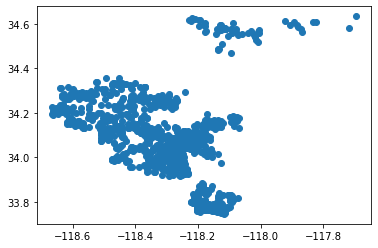

In [65]:
plt.scatter(x=LAC_parks_trimmed['CENTER_LON'], y=LAC_parks_trimmed['CENTER_LAT'])
plt.show()

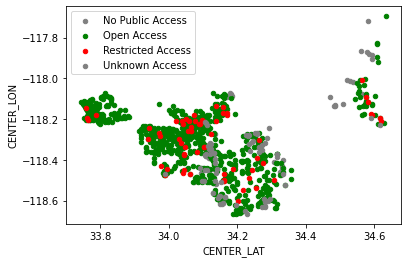

In [66]:
fig, ax = plt.subplots()

colors = {'Open Access':'green','Unknown Access':'gray', 'No Public Access':'gray','Restricted Access':'red'}

grouped = LAC_parks_trimmed.groupby('ACCESS_TYP')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='CENTER_LAT', y='CENTER_LON', label=key, color=colors[key])

plt.show()

In [67]:
# each color represents access to parks! now to map with folium
import folium

In [68]:
# default folium map
m = folium.Map()
m

In [69]:
# average latitude
latitude = LAC_parks_trimmed.CENTER_LAT.mean()
latitude

34.09518810713138

In [70]:
# average lONGItude
longitude = LAC_parks_trimmed.CENTER_LON.mean()
longitude

-118.3105152082246

In [71]:
#centering based on average latitude / longitude means
m = folium.Map(location=[34.09518810713138,-118.3105152082246])
m

In [72]:
# loop through a dataframe:
for index, row in LAC_parks_trimmed.iterrows():
    print(row.PARK_NAME, row.CENTER_LAT, row.CENTER_LON)

John Quimby Park 34.19837981 -118.5878263
Chatsworth Nature Preserve and Reservoir 34.23176523 -118.6294986
Lanark Park 34.21655395 -118.6037751
Bell Canyon Open Space 34.20952122 -118.6625325
Lazy J Ranch Park 34.21311537 -118.6451384
Bell Canyon Open Space 34.21232029 -118.6557023
Orcutt Ranch Horticultural Center Park 34.21809518 -118.6404893
Parthenia Park 34.2277341 -118.59893
Roscoe-Valley Circle Park 34.21663723 -118.6508452
Taxco Trails Park 34.21254129 -118.6382835
Castle Peak Park 34.20729683 -118.6534046
Chase Park 34.22363902 -118.6178733
Canoga Park Senior Citizen Center 34.20364637 -118.6025159
Chatsworth Reservoir Site 34.23662458 -118.6397816
Unnamed site - Mountains Recreation and Conservation Authority 34.22370275 -118.6527135
Unnamed site - Mountains Recreation and Conservation Authority 34.22782569 -118.6661142
Garden of the Gods 34.27324086 -118.6109988
Garden of the Gods Park 34.27450879 -118.6017148
Unnamed site - Mountains Recreation and Conservation Authority 3

In [73]:
# add the zipcodes
for index, row in LAC_parks_trimmed.iterrows():
    # add folium marker code
    folium.Marker([row.CENTER_LAT, row.CENTER_LON], popup=row.PARK_NAME, tooltip=row.PARK_NAME).add_to(m)
m

In [74]:
# add a new column
LAC_parks_trimmed['green'] = 'Open Access'
LAC_parks_trimmed['gray'] = 'Unknown Access'
LAC_parks_trimmed['yellow'] = 'Restricted Access'
LAC_parks_trimmed['red'] = 'No Public Access'

In [75]:
LAC_parks_trimmed.head()

,PARK_NAME,ACCESS_TYP,AGNCY_NAME,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,Shape__Area,Shape__Length,green,gray,yellow,red
0,John Quimby Park,Open Access,"Los Angeles, City of",34.198380,-118.587826,7008 De Soto Ave,Los Angeles,91303,1.855665e+05,1858.825878,Open Access,Unknown Access,Restricted Access,No Public Access
1,Chatsworth Nature Preserve and Reservoir,Open Access,"Los Angeles - Department of Water and Power, C...",34.231765,-118.629499,Chatsworth,Los Angeles,91304,4.468064e+07,50842.102240,Open Access,Unknown Access,Restricted Access,No Public Access
2,Lanark Park,Open Access,"Los Angeles, City of",34.216554,-118.603775,21816 Lanark St,Los Angeles,91304,8.362881e+05,3788.732565,Open Access,Unknown Access,Restricted Access,No Public Access
3,Bell Canyon Open Space,Open Access,Mountains Recreation and Conservation Authority,34.209521,-118.662532,West Hills,Los Angeles,91304,2.497728e+06,11762.592640,Open Access,Unknown Access,Restricted Access,No Public Access
4,Lazy J Ranch Park,Open Access,"Los Angeles, City of",34.213115,-118.645138,Ingomar,Los Angeles,91304,3.673877e+05,2876.037482,Open Access,Unknown Access,Restricted Access,No Public Access


In [76]:
# find unique values in the City column
LAC_parks_trimmed.ACCESS_TYP.unique()

array(['Open Access', 'Restricted Access', 'Unknown Access',
       'No Public Access'], dtype=object)

In [77]:
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Open Access']
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Open Access', 'color'] = 'green'
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Open Access']

LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Unknown Access']
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Unknown Access', 'color'] = 'gray'
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Unknown Access']

LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Restricted Access']
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Restricted Access', 'color'] = 'white'
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'Restricted Access']

LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'No Public Access']
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'No Public Access', 'color'] = 'red'
LAC_parks_trimmed.loc[LAC_parks_trimmed['ACCESS_TYP'] == 'No Public Access']

,PARK_NAME,ACCESS_TYP,AGNCY_NAME,CENTER_LAT,CENTER_LON,ADDRESS,CITY,ZIP,Shape__Area,Shape__Length,green,gray,yellow,red,color
38,Unnamed site - Mountains Recreation and Conser...,No Public Access,Mountains Recreation and Conservation Authority,34.279371,-118.592782,,Los Angeles,91311,2.990554e+03,229.984565,Open Access,Unknown Access,Restricted Access,No Public Access,red
50,Encino Reservoir,No Public Access,"Los Angeles - Department of Water and Power, C...",34.138569,-118.517693,Encino Reservoir,Los Angeles,91316,4.611577e+07,37013.782180,Open Access,Unknown Access,Restricted Access,No Public Access,red
169,Drake/Chavez Soccer Fields and Parkway,No Public Access,"Long Beach, City of",33.779824,-118.202485,903-999 Fairbanks Ave,Long Beach,90813,3.455998e+05,4787.801563,Open Access,Unknown Access,Restricted Access,No Public Access,red
208,Robert Gumbiner Park,No Public Access,"Long Beach, City of",33.774918,-118.180489,628-662 Martin Luther King Jr Ave,Long Beach,90802,4.529731e+03,374.770552,Open Access,Unknown Access,Restricted Access,No Public Access,red
235,Long Beach Greenbelt,No Public Access,"Long Beach, City of",33.778660,-118.147937,Long Beach Greenbelt (Pacific Electric Right o...,Long Beach,90804,1.614714e+05,3553.508595,Open Access,Unknown Access,Restricted Access,No Public Access,red
239,Sleepy Hollow Greenbelt (No Public Access),No Public Access,"Long Beach, City of",33.844310,-118.190690,,Long Beach,90805,9.611784e+04,4664.512780,Open Access,Unknown Access,Restricted Access,No Public Access,red
322,Encino Reservoir - Federal,No Public Access,Other Federal,34.129695,-118.513805,Encino Reservoir,Los Angeles,90049,6.404808e+04,1155.961571,Open Access,Unknown Access,Restricted Access,No Public Access,red
331,Sullivan Canyon Creek & Dam,No Public Access,"Los Angeles - Flood Control District, County of",34.074777,-118.509379,,Los Angeles,90049,4.655136e+05,4720.029604,Open Access,Unknown Access,Restricted Access,No Public Access,red
338,Stone Canyon Reservoir & Watershed,No Public Access,"Los Angeles, City of",34.116850,-118.455594,Stone Canyon Reservoir,Los Angeles,90077,3.256811e+07,147435.826100,Open Access,Unknown Access,Restricted Access,No Public Access,red
365,Lake Hollywood Reservoir,No Public Access,"Los Angeles - Department of Water and Power, C...",34.121348,-118.331551,Hollywood Reservoir,Los Angeles,90068,9.731976e+06,20078.548940,Open Access,Unknown Access,Restricted Access,No Public Access,red


In [78]:
# reset the map (you need to do this to erase previous layers)
m = folium.Map(location=[latitude,longitude], tiles='Stamen Terrain', zoom_start=10)

In [79]:
# add the parks by access
for index, row in LAC_parks_trimmed.iterrows():
    tooltip_text = row.ACCESS_TYP + ' ACCESS_TYP: ' + row.PARK_NAME
    folium.Marker(
        [row.CENTER_LAT,row.CENTER_LON], 
        popup=row.PARK_NAME, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)

# show the map
m

In [80]:
# save the interactive maps as an html file
m.save('LAC_parks.html')